<a href="https://colab.research.google.com/github/hoangnuthuphuong/final_project-a/blob/main/CanDetect_Autoencoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

###CHUẨN BỊ

In [ ]:
import os
import shutil
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_curve, auc, accuracy_score, precision_recall_fscore_support, classification_report
import random
from google.colab import files, drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Xác định đường dẫn đến file ZIP
zip_path = '/content/drive/MyDrive/DOANTOTNGHIEP/DATA_FULL.zip'

# Giải nén tập tin vào thư mục /content/dataset
!unzip -q {zip_path} -d /content/dataset

## Chuẩn bị và tiền xử lý dữ liệu huấn luyện (ảnh OK)

Tải các ảnh lon đạt chuẩn (OK) từ thư mục '/content/dataset/data', thay đổi kích thước và chuẩn hóa chúng để chuẩn bị cho quá trình huấn luyện Autoencoder.


**Mục đích chính:** Tiền xử lý dữ liệu ảnh (Image Preprocessing) để chuẩn bị các ảnh "can_ok" (lon đạt chuẩn) cho mô hình học máy.
* Công cụ sử dụng: os (Xử lý hệ thống file), cv2 (OpenCV cho xử lý ảnh), numpy (Xử lý mảng dữ liệu lớn).
* Lọc file: Code chỉ chọn các file là ảnh và có chứa chuỗi 'can_ok' trong tên.
* Đọc ảnh: Đọc ảnh dưới dạng đen trắng (Grayscale) để giảm kích thước dữ liệu (1 kênh màu).
* Xử lý kích thước: Thay đổi kích thước tất cả ảnh về kích thước đồng nhất 224x224 pixels.
* Chuẩn hóa (Normalization): Chuyển đổi giá trị pixel từ dải $[0, 255]$ sang dải $[0.0, 1.0]$.
* Kết xuất: Chuyển đổi dữ liệu cuối cùng thành mảng NumPy 4 chiều (N, 224, 224, 1) để phù hợp với các mô hình Deep Learning.

In [ ]:
import os
import cv2
import numpy as np

# 1. Define the path to the directory containing the 'OK' images
image_dir = '/content/dataset/data'

# 2. Create an empty list to store the preprocessed images
preprocessed_images = []

# 3. Define the target image dimensions (width, height)
target_size = (224, 224) # A common size for autoencoders, can be adjusted

print(f"Starting image preprocessing from: {image_dir}")
print(f"Target image size: {target_size}")

# 4. Loop through all files in the specified directory
for filename in os.listdir(image_dir):
    # Check if the file is an image and contains 'can_ok' in its name
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')) and 'can_ok' in filename.lower():
        image_path = os.path.join(image_dir, filename)

        # 5. Read each identified 'OK' image using cv2.imread in grayscale format
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"Warning: Could not read image {filename}. Skipping.")
            continue

        # 6. Resize the image to the predefined dimensions using cv2.resize
        resized_image = cv2.resize(image, target_size)

        # 7. Normalize the pixel values of the resized image by dividing by 255.0
        #    to scale them between 0 and 1.
        normalized_image = resized_image.astype('float32') / 255.0

        # 8. Add the preprocessed image to the list
        preprocessed_images.append(normalized_image)

print(f"Found and preprocessed {len(preprocessed_images)} 'can_ok' images.")

# 9. Convert the list of preprocessed images into a NumPy array.
#    Reshape the array to include a channel dimension (height, width, 1) for grayscale images.
dataset_ok = np.array(preprocessed_images).reshape(-1, target_size[0], target_size[1], 1)

print(f"Shape of the final preprocessed dataset_ok: {dataset_ok.shape}")

Starting image preprocessing from: /content/dataset/data
Target image size: (224, 224)
Found and preprocessed 2732 'can_ok' images.
Shape of the final preprocessed dataset_ok: (2486, 224, 224, 1)


Xem hình ảnh đầu vào và ảnh sau khi xử lý

Using target image size for preprocessing: (224, 224)
Selected random image for visualization: /content/dataset/DATA_TEST/can_ok-136-_bmp.rf.a0aeb9f090d1d4cfa1d876a60f503916.jpg


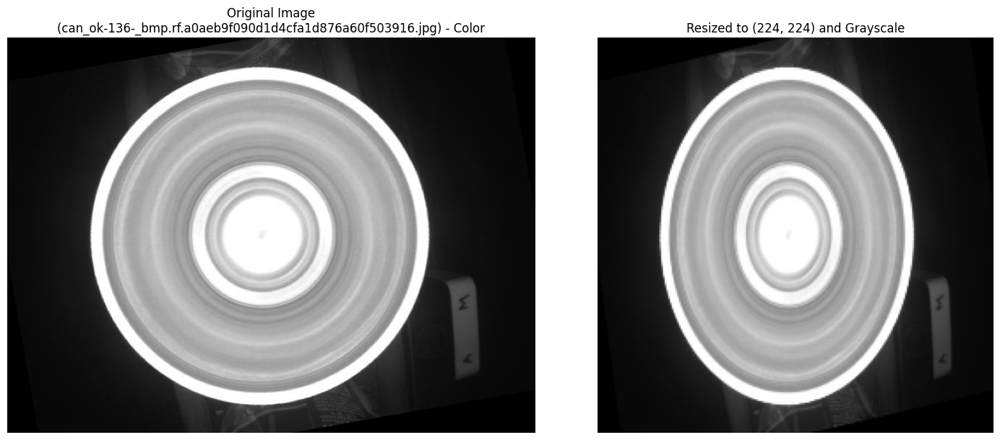

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Ensure target_size is defined from previous steps
# target_size = (224, 224) # Already defined

print(f"Using target image size for preprocessing: {target_size}")

# 1. Dynamically select a random image path from the test directory
test_image_dir = '/content/dataset/DATA_TEST'
all_test_files = [f for f in os.listdir(test_image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]

if not all_test_files:
    print(f"Error: No image files found in {test_image_dir}. Please check the directory.")
else:
    image_filename = random.choice(all_test_files)
    image_path = os.path.join(test_image_dir, image_filename)
    print(f"Selected random image for visualization: {image_path}")

    # 2. Read the original image (in color to show conversion to grayscale)
    original_image_color = cv2.imread(image_path, cv2.IMREAD_COLOR)

    if original_image_color is None:
        print(f"Error: Could not read original image from {image_path}. Skipping visualization.")
    else:
        # Convert to RGB for matplotlib display if read as BGR
        original_image_rgb = cv2.cvtColor(original_image_color, cv2.COLOR_BGR2RGB)

        # 3. Preprocess the image (resize and convert to grayscale)
        # Read in grayscale first
        grayscale_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        resized_grayscale_image = cv2.resize(grayscale_image, target_size)

        # Display the original and preprocessed images
        plt.figure(figsize=(15, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(original_image_rgb)
        plt.title(f"Original Image\n({image_filename}) - Color")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(resized_grayscale_image, cmap='gray')
        plt.title(f"Resized to {target_size} and Grayscale")
        plt.axis('off')

        plt.tight_layout()
        plt.show()


## Xây dựng và huấn luyện mô hình Autoencoder

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Reshape
from tensorflow.keras.models import Model

# Input image dimensions from previous step (target_size was 224*224, grayscale is 1 channel)
input_shape = (dataset_ok.shape[1], dataset_ok.shape[2], dataset_ok.shape[3])

# --- 1. Define the Encoder ---
input_img = Input(shape=input_shape)

# Encoder architecture
x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x) # Latent space representation

# --- 2. Define the Decoder ---
# Decoder architecture
x = Conv2D(256, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu', padding='same')(x) # Corrected line: should use 'x' instead of 'encoded'
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x) # Output a grayscale image (1 channel) normalized to [0,1]

# --- 3. Combine Encoder and Decoder to create the full Autoencoder model ---
autoencoder = Model(input_img, decoded)

# --- 4. Compile the Autoencoder model ---
autoencoder.compile(optimizer='adam', loss='mean_squared_error')

autoencoder.summary()

print("Autoencoder model defined and compiled successfully.")

# --- 5. Train the Autoencoder model ---
# Using dataset_ok for both input and target, as autoencoders reconstruct their input

# You can adjust epochs, batch_size, and validation_split based on your needs
epochs = 50 # Start with a reasonable number, can be increased or decreased
batch_size = 32
validation_split = 0.3

print(f"\nStarting Autoencoder training for {epochs} epochs...")
history = autoencoder.fit(dataset_ok, dataset_ok,
                          epochs=epochs,
                          batch_size=batch_size,
                          shuffle=True,
                          validation_split=validation_split,
                          verbose=1)

print("Autoencoder training complete.")

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 224, 224, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 14, 14, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 14, 14, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_11 (UpSampling2D) │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 28, 28, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_12 (UpSampling2D) │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 56, 56, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_13 (UpSampling2D) │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 112, 112, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_14 (UpSampling2D) │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_33 (Conv2D)              │ (None, 224, 224, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,365,505 (5.21 MB)

 Trainable params: 1,365,505 (5.21 MB)

 Non-trainable params: 0 (0.00 B)

Autoencoder model defined and compiled successfully.

Starting Autoencoder training for 50 epochs...
Epoch 1/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 17s 208ms/step - loss: 0.0678 - val_loss: 0.0143
Epoch 2/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 128ms/step - loss: 0.0132 - val_loss: 0.0100
Epoch 3/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.0097 - val_loss: 0.0090
Epoch 4/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 127ms/step - loss: 0.0078 - val_loss: 0.0050
Epoch 5/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0047 - val_loss: 0.0067
Epoch 6/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 124ms/step - loss: 0.0054 - val_loss: 0.0033
Epoch 7/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 122ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 8/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.0031 - val_loss: 0.0045
Epoch 9/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 121ms/step - loss: 0.0034 - val_loss: 0.0026
Epoch 10/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 123ms/step - loss: 0.0026 - val_loss: 0.0022
Epoch 11/50
55/55 ━━━━━━━━━━━━━━━━━━━

## Xác định ngưỡng phát hiện bất thường

Sử dụng Autoencoder đã huấn luyện để tái tạo lại các ảnh OK trong tập huấn luyện. Tính toán lỗi tái tạo (reconstruction error) và xác định một ngưỡng (threshold) để phân biệt giữa ảnh OK và ảnh bất thường (NG).


In [ ]:
import numpy as np

# 1. Sử dụng mô hình autoencoder đã huấn luyện để dự đoán (tái tạo) các ảnh trong dataset_ok.
#    Lưu kết quả vào reconstructed_images.
print("Reconstructing 'OK' images using the trained autoencoder...")
reconstructed_images = autoencoder.predict(dataset_ok)
print("Reconstruction complete.")

# 2. Tính toán lỗi tái tạo (reconstruction error) cho mỗi ảnh.
#    Sử dụng sai số bình phương trung bình (Mean Squared Error - MSE) giữa ảnh gốc và ảnh tái tạo.
#    Chuyển đổi mảng lỗi tái tạo thành một mảng 1D.
print("Calculating reconstruction errors (MSE)...")
reconstruction_errors = np.mean(np.square(dataset_ok - reconstructed_images), axis=(1, 2, 3))
print(f"Calculated {len(reconstruction_errors)} reconstruction errors.")

# 3. Xác định ngưỡng phát hiện bất thường.
#    Chọn giá trị phần trăm thứ 99 của phân phối lỗi tái tạo trên các ảnh OK đã huấn luyện.
threshold = np.percentile(reconstruction_errors, 99) # Using 99th percentile as a common choice for anomaly detection

print(f"Reconstruction errors shape: {reconstruction_errors.shape}")
print(f"Calculated anomaly detection threshold: {threshold:.4f}")

Reconstructing 'OK' images using the trained autoencoder...
78/78 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step
Reconstruction complete.
Calculating reconstruction errors (MSE)...
Calculated 2486 reconstruction errors.
Reconstruction errors shape: (2486,)
Calculated anomaly detection threshold: 0.0008


# KIỂM THỬ Tải và tiền xử lý dữ liệu kiểm tra (DATA_TEST)

Tải các ảnh từ thư mục '/content/dataset/DATA_TEST', tiền xử lý chúng tương tự như dữ liệu huấn luyện. Trích xuất nhãn thực (OK/NG) từ tên file ảnh ('ng' cho NG, 'ok' cho OK).


In [ ]:
#TIỀN XỬ LÝ DỮ LIỆU ĐẦU VÀO CHO TẬP DATA_TEST

import os
import cv2
import numpy as np

# 1. Define the path to the directory containing the test images
test_image_dir = '/content/dataset/DATA_TEST'

# 2. Create empty lists to store the preprocessed test images and their true labels
preprocessed_test_images = []
true_test_labels = [] # To store 'can_ok' or 'can_ng'

# target_size is already defined from previous step (128, 128)
target_size = (224, 224)

print(f"Starting test image preprocessing from: {test_image_dir}")
print(f"Target image size: {target_size}")

# 3. Loop through all files in the specified test directory
for filename in os.listdir(test_image_dir):
    # 4. Check if the file is an image
    if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp')):
        image_path = os.path.join(test_image_dir, filename)

        # a. Read each image using cv2.imread in grayscale format
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"Warning: Could not read image {filename}. Skipping.")
            continue

        # b. Resize the image to the predefined dimensions
        resized_image = cv2.resize(image, target_size)

        # c. Normalize the pixel values of the resized image by dividing by 255.0
        normalized_image = resized_image.astype('float32') / 255.0

        # d. Extract the true label ('can_ok' or 'can_ng') from the filename
        true_label = None
        if 'can_ok' in filename.lower():
            true_label = 'can_ok'
        elif 'can_ng' in filename.lower():
            true_label = 'can_ng'

        if true_label is None:
            print(f"Warning: Could not determine true label for {filename}. Skipping.")
            continue

        # e. Add the preprocessed image and true label to their respective lists
        preprocessed_test_images.append(normalized_image)
        true_test_labels.append(true_label)

print(f"Found and preprocessed {len(preprocessed_test_images)} test images.")

# 5. Convert the list of preprocessed test images into a NumPy array.
#    Reshape the array to include a channel dimension (height, width, 1) for grayscale images.
dataset_test_images = np.array(preprocessed_test_images).reshape(-1, target_size[0], target_size[1], 1)

# 6. Convert the list of true test labels into a NumPy array.
dataset_test_labels = np.array(true_test_labels)

print(f"Shape of the final preprocessed dataset_test_images: {dataset_test_images.shape}")
print(f"Shape of the final dataset_test_labels: {dataset_test_labels.shape}")

Starting test image preprocessing from: /content/dataset/DATA_TEST
Target image size: (224, 224)
Found and preprocessed 1000 test images.
Shape of the final preprocessed dataset_test_images: (1000, 224, 224, 1)
Shape of the final dataset_test_labels: (1000,)


## Đánh giá mô hình trên dữ liệu kiểm tra


In [ ]:
import numpy as np

# 1. Sử dụng mô hình Autoencoder đã huấn luyện để dự đoán (tái tạo) các ảnh trong tập dữ liệu kiểm tra.
#    Lưu kết quả vào reconstructed_test_images.
print("Reconstructing test images using the trained autoencoder...")
reconstructed_test_images = autoencoder.predict(dataset_test_images)
print("Reconstruction of test images complete.")

# 2. Tính toán lỗi tái tạo (reconstruction error) cho mỗi ảnh trong tập kiểm tra.
#    Sử dụng sai số bình phương trung bình (Mean Squared Error - MSE) giữa ảnh gốc và ảnh tái tạo.
#    Chuyển đổi mảng lỗi tái tạo thành một mảng 1D.
print("Calculating reconstruction errors for test images...")
test_reconstruction_errors = np.mean(np.square(dataset_test_images - reconstructed_test_images), axis=(1, 2, 3))
print(f"Calculated {len(test_reconstruction_errors)} reconstruction errors for test images.")

# 3. Dựa vào ngưỡng phát hiện bất thường (threshold) đã xác định ở bước trước,
#    phân loại mỗi ảnh kiểm tra là 'can_ok' nếu lỗi tái tạo nhỏ hơn hoặc bằng ngưỡng,
#    và 'can_ng' nếu lỗi tái tạo lớn hơn ngưỡng. Lưu các nhãn dự đoán này vào một danh sách hoặc mảng.
predicted_labels = []
for error in test_reconstruction_errors:
    if error <= threshold:
        predicted_labels.append('can_ok')
    else:
        predicted_labels.append('can_ng')
predicted_labels = np.array(predicted_labels)

print(f"Predicted labels generated for {len(predicted_labels)} test images.")

# 4. So sánh các nhãn dự đoán với nhãn thực tế để đánh giá hiệu suất của mô hình.
#    Tính toán số lượng dự đoán đúng và sai cho cả hai loại 'can_ok' và 'can_ng'.
correct_predictions = {'can_ng': 0, 'can_ok': 0}
incorrect_predictions = {'can_ng': 0, 'can_ok': 0}

for i in range(len(dataset_test_labels)):
    true_label = dataset_test_labels[i]
    pred_label = predicted_labels[i]

    if true_label == pred_label:
        correct_predictions[true_label] += 1
    else:
        incorrect_predictions[true_label] += 1

print("\n--- Evaluation Results ---")
print("Correct Predictions:", correct_predictions)
print("Incorrect Predictions:", incorrect_predictions)

total_correct = sum(correct_predictions.values())
total_incorrect = sum(incorrect_predictions.values())
total_images_processed = total_correct + total_incorrect

overall_accuracy = (total_correct / total_images_processed) * 100 if total_images_processed > 0 else 0

print(f"\nTotal test images processed: {total_images_processed}")
print(f"Overall Accuracy: {overall_accuracy:.2f}%")

# Calculate accuracy for each label
total_can_ng_images = correct_predictions['can_ng'] + incorrect_predictions['can_ng']
accuracy_can_ng = (correct_predictions['can_ng'] / total_can_ng_images) * 100 if total_can_ng_images > 0 else 0

total_can_ok_images = correct_predictions['can_ok'] + incorrect_predictions['can_ok']
accuracy_can_ok = (correct_predictions['can_ok'] / total_can_ok_images) * 100 if total_can_ok_images > 0 else 0

print("\n--- Detailed Accuracy Results ---")
print(f"Accuracy for 'can_ng': {accuracy_can_ng:.2f}%")
print(f"Accuracy for 'can_ok': {accuracy_can_ok:.2f}%")
print(f"Overall Average Accuracy: {overall_accuracy:.2f}%")

Reconstructing test images using the trained autoencoder...
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step
Reconstruction of test images complete.
Calculating reconstruction errors for test images...
Calculated 1000 reconstruction errors for test images.
Predicted labels generated for 1000 test images.

--- Evaluation Results ---
Correct Predictions: {'can_ng': 242, 'can_ok': 490}
Incorrect Predictions: {'can_ng': 258, 'can_ok': 10}

Total test images processed: 1000
Overall Accuracy: 73.20%

--- Detailed Accuracy Results ---
Accuracy for 'can_ng': 48.40%
Accuracy for 'can_ok': 98.00%
Overall Average Accuracy: 73.20%


## KẾT QUẢ HUẤN LUYỆN BAN ĐẦU:

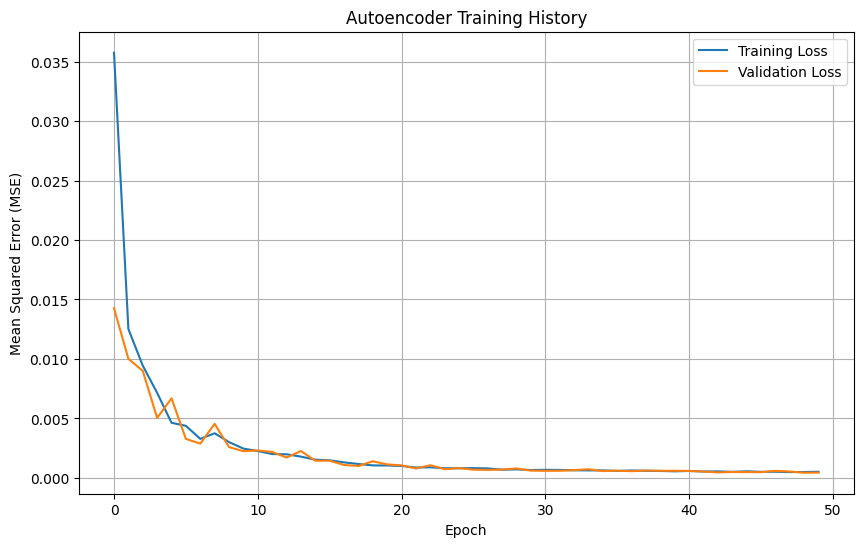

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix
import random

# --- 1. Vẽ biểu đồ lịch sử huấn luyện (Training History Plot) ---
# Đảm bảo rằng bạn đã lưu lịch sử huấn luyện vào biến 'history'
if 'history' in locals():
    plt.figure(figsize=(10, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Autoencoder Training History')
    plt.xlabel('Epoch')
    plt.ylabel('Mean Squared Error (MSE)')
    plt.legend()
    plt.grid(True)
    plt.show()
else:
    print("Lịch sử huấn luyện (history) không tìm thấy. Hãy đảm bảo mô hình đã được huấn luyện.")

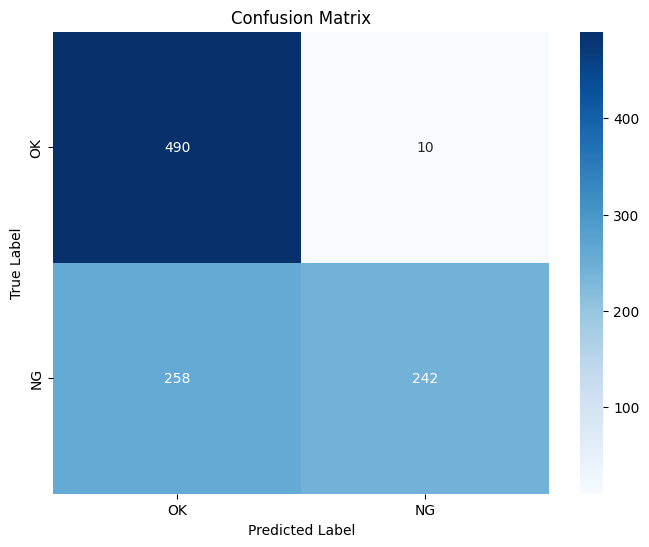

In [ ]:
# --- 2. Vẽ ma trận hỗn hợp (Confusion Matrix) ---
# Chuyển đổi nhãn string thành dạng số để vẽ confusion matrix
# 'can_ok' -> 0, 'can_ng' -> 1
true_labels_numeric = np.array([0 if label == 'can_ok' else 1 for label in dataset_test_labels])
predicted_labels_numeric = np.array([0 if label == 'can_ok' else 1 for label in predicted_labels])

cm = confusion_matrix(true_labels_numeric, predicted_labels_numeric)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['OK', 'NG'],
            yticklabels=['OK', 'NG'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

###HIỂN THỊ KẾT QUẢ

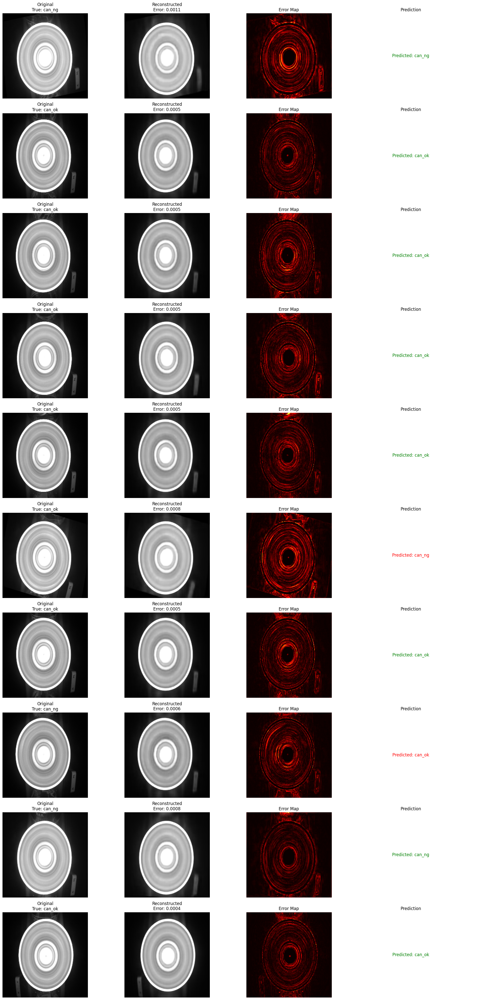

In [ ]:
# --- 3. Hiển thị kết quả kiểm tra một số ảnh mẫu ---

# Lấy ngẫu nhiên một vài ảnh từ tập kiểm tra
num_samples = 10
indices = random.sample(range(len(dataset_test_images)), num_samples)

plt.figure(figsize=(20, 4 * num_samples)) # Tăng chiều cao để đủ chỗ cho nhiều ảnh

for i, idx in enumerate(indices):
    original_image = dataset_test_images[idx]
    reconstructed_image = reconstructed_test_images[idx]
    error = test_reconstruction_errors[idx]
    true_label = dataset_test_labels[idx]
    predicted_label = predicted_labels[idx]

    # Hình ảnh gốc
    plt.subplot(num_samples, 4, i * 4 + 1)
    plt.imshow(original_image.squeeze(), cmap='gray')
    plt.title(f"Original\nTrue: {true_label}")
    plt.axis('off')

    # Hình ảnh tái tạo
    plt.subplot(num_samples, 4, i * 4 + 2)
    plt.imshow(reconstructed_image.squeeze(), cmap='gray')
    plt.title(f"Reconstructed\nError: {error:.4f}")
    plt.axis('off')

    # Heatmap lỗi (tùy chọn, để xem vùng lỗi lớn)
    error_map = np.abs(original_image - reconstructed_image).squeeze()
    plt.subplot(num_samples, 4, i * 4 + 3)
    plt.imshow(error_map, cmap='hot')
    plt.title(f"Error Map")
    plt.axis('off')

    # Kết quả dự đoán
    plt.subplot(num_samples, 4, i * 4 + 4)
    plt.text(0.5, 0.5, f"Predicted: {predicted_label}",
             horizontalalignment='center', verticalalignment='center',
             fontsize=12, color='green' if true_label == predicted_label else 'red')
    plt.title(f"Prediction")
    plt.axis('off')

plt.tight_layout()
plt.show()

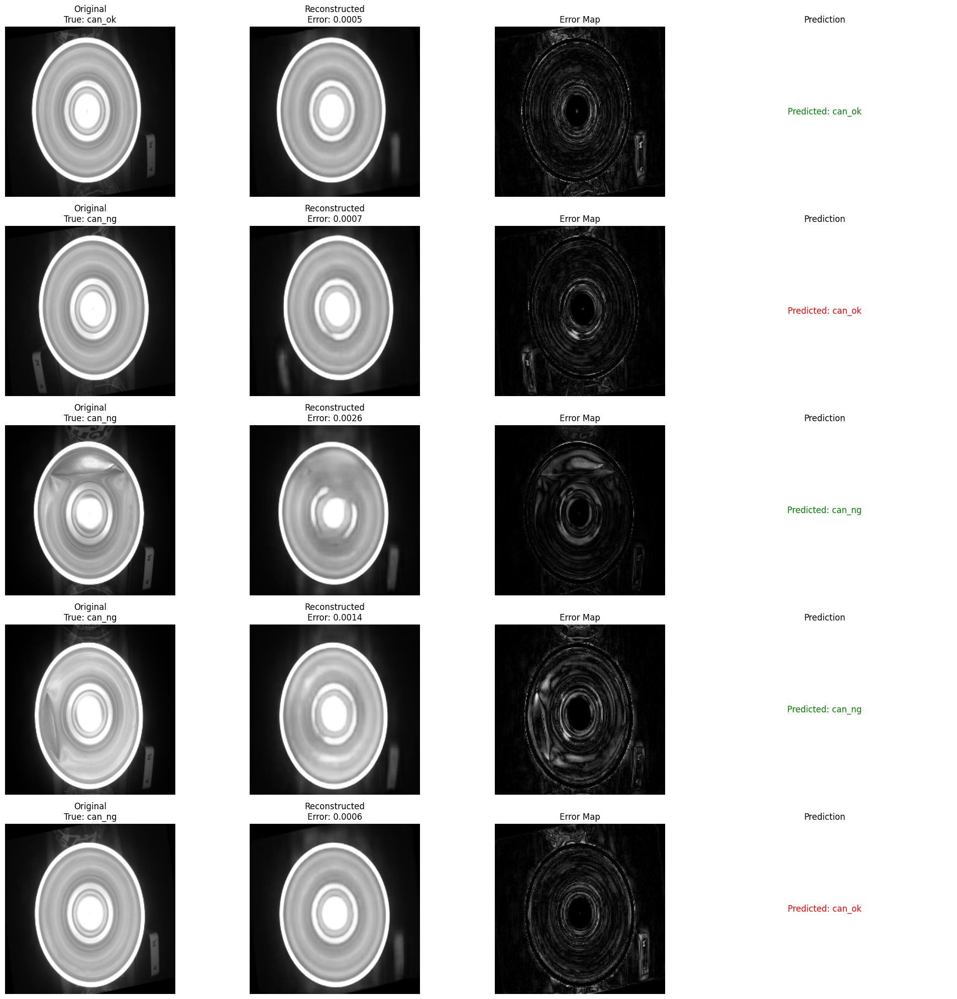

In [ ]:
# --- 3. Hiển thị kết quả kiểm tra một số ảnh mẫu ---

# Lấy ngẫu nhiên một vài ảnh từ tập kiểm tra
num_samples = 5
indices = random.sample(range(len(dataset_test_images)), num_samples)

plt.figure(figsize=(20, 4 * num_samples)) # Tăng chiều cao để đủ chỗ cho nhiều ảnh

for i, idx in enumerate(indices):
    original_image = dataset_test_images[idx]
    reconstructed_image = reconstructed_test_images[idx]
    error = test_reconstruction_errors[idx]
    true_label = dataset_test_labels[idx]
    predicted_label = predicted_labels[idx]

    # Hình ảnh gốc
    plt.subplot(num_samples, 4, i * 4 + 1)
    plt.imshow(original_image.squeeze(), cmap='gray')
    plt.title(f"Original\nTrue: {true_label}")
    plt.axis('off')

    # Hình ảnh tái tạo
    plt.subplot(num_samples, 4, i * 4 + 2)
    plt.imshow(reconstructed_image.squeeze(), cmap='gray')
    plt.title(f"Reconstructed\nError: {error:.4f}")
    plt.axis('off')

    # Heatmap lỗi (tùy chọn, để xem vùng lỗi lớn)
    error_map = np.abs(original_image - reconstructed_image).squeeze()
    plt.subplot(num_samples, 4, i * 4 + 3)
    plt.imshow(error_map, cmap='gray')
    plt.title(f"Error Map")
    plt.axis('off')

    # Kết quả dự đoán
    plt.subplot(num_samples, 4, i * 4 + 4)
    plt.text(0.5, 0.5, f"Predicted: {predicted_label}",
             horizontalalignment='center', verticalalignment='center',
             fontsize=12, color='green' if true_label == predicted_label else 'red')
    plt.title(f"Prediction")
    plt.axis('off')

plt.tight_layout()
plt.show()

# TỐI ƯU HOÁ...

# Đánh giá Hiệu suất và Xác định Ngưỡng Tối ưu bằng Đường cong ROC

Sử dụng Autoencoder đã huấn luyện để tái tạo lại tất cả ảnh kiểm tra. Tính toán lỗi tái tạo (MSE) cho từng ảnh. Dựa trên lỗi tái tạo và nhãn thực, xây dựng đường cong ROC và xác định một ngưỡng tối ưu để phân loại OK/NG (ví dụ, sử dụng Youden's J statistic hoặc điểm F1-score tối đa).


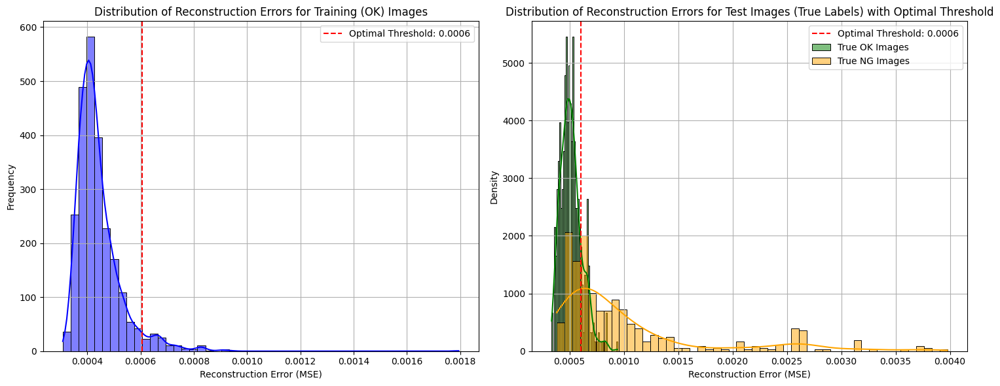

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Vẽ biểu đồ phân bố lỗi tái tạo và ngưỡng tối ưu ---

# Tạo figure với 2 subplot
plt.figure(figsize=(15, 6))

# Subplot 1: Phân bố lỗi tái tạo cho ảnh 'can_ok' trong tập huấn luyện (giữ nguyên để so sánh)
plt.subplot(1, 2, 1)
sns.histplot(reconstruction_errors, bins=50, kde=True, color='blue')
plt.axvline(x=optimal_threshold, color='red', linestyle='--', label=f'Optimal Threshold: {optimal_threshold:.4f}')
plt.title('Distribution of Reconstruction Errors for Training (OK) Images')
plt.xlabel('Reconstruction Error (MSE)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)

# Subplot 2: Phân bố lỗi tái tạo cho ảnh kiểm tra (phân biệt OK/NG thật) với ngưỡng tối ưu
plt.subplot(1, 2, 2)

# Lấy lỗi tái tạo cho ảnh OK thực sự trong tập test
ok_test_errors = test_reconstruction_errors[dataset_test_labels == 'can_ok']
# Lấy lỗi tái tạo cho ảnh NG thực sự trong tập test
ng_test_errors = test_reconstruction_errors[dataset_test_labels == 'can_ng']

sns.histplot(ok_test_errors, bins=50, kde=True, color='green', label='True OK Images', stat='density')
sns.histplot(ng_test_errors, bins=50, kde=True, color='orange', label='True NG Images', stat='density')
plt.axvline(x=optimal_threshold, color='red', linestyle='--', label=f'Optimal Threshold: {optimal_threshold:.4f}')
plt.title('Distribution of Reconstruction Errors for Test Images (True Labels) with Optimal Threshold')
plt.xlabel('Reconstruction Error (MSE)')
plt.ylabel('Density')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

Converted true labels for ROC: (1000,)
Sample numeric labels: [1 0 1 1 0 1 1 0 0 0]
ROC AUC: 0.8356
Optimal threshold found using Youden's J statistic: 0.0006


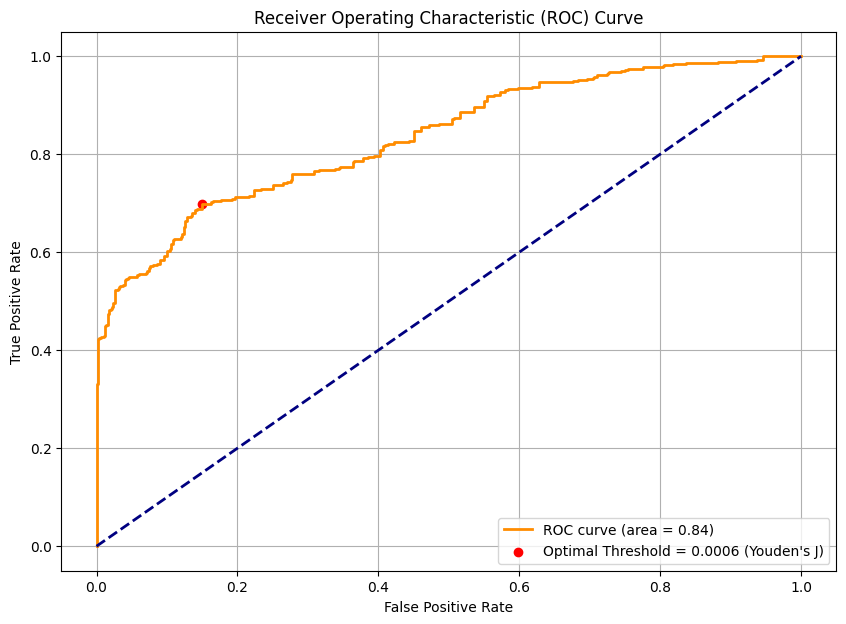

In [ ]:
from sklearn.metrics import roc_curve, auc
import numpy as np

# 3. Prepare true labels for ROC curve (0 for 'can_ok', 1 for 'can_ng')
# Note: For anomaly detection, higher error typically means 'anomaly'.
# So, 'can_ng' (anomaly) should be 1, 'can_ok' (normal) should be 0.
# The current labels `dataset_test_labels` are strings. We convert them to numeric.

true_labels_numeric_roc = np.array([1 if label == 'can_ng' else 0 for label in dataset_test_labels])

print(f"Converted true labels for ROC: {true_labels_numeric_roc.shape}")
print(f"Sample numeric labels: {true_labels_numeric_roc[:10]}")

# 4. Build the ROC curve
# roc_curve expects positive class (1) to be associated with higher scores/errors
# Since 'can_ng' is 1 and higher errors signify 'can_ng', this aligns correctly.
fpr, tpr, thresholds_roc = roc_curve(true_labels_numeric_roc, test_reconstruction_errors)
roc_auc = auc(fpr, tpr)

print(f"ROC AUC: {roc_auc:.4f}")

# 5. Calculate Youden's J statistic (J = TPR - FPR) and determine the optimal threshold
youdens_j = tpr - fpr
optimal_idx = np.argmax(youdens_j)
optimal_threshold = thresholds_roc[optimal_idx]

print(f"Optimal threshold found using Youden's J statistic: {optimal_threshold:.4f}")

# Visualize ROC curve and optimal threshold (optional, but good for understanding)
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], marker='o', color='red',
            label=f'Optimal Threshold = {optimal_threshold:.4f} (Youden\'s J)')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# KẾT QUẢ SAU TỐI ƯU

Áp dụng ngưỡng tối ưu đã xác định để phân loại từng ảnh kiểm tra là 'can_ok' hoặc 'can_ng'. Tính toán và trình bày các chỉ số hiệu suất chi tiết như độ chính xác, độ chính xác cho từng lớp (Precision, Recall, F1-score) và ma trận nhầm lẫn (Confusion Matrix).


Predicted labels generated with optimal threshold for 1000 test images.

--- Evaluation Results ---
Correct Predictions: {'can_ng': 344, 'can_ok': 425}
Incorrect Predictions: {'can_ng': 156, 'can_ok': 75}

Total test images processed: 1000
Overall Accuracy: 76.90%

--- Detailed Accuracy Results ---
Accuracy for 'can_ng': 68.80%
Accuracy for 'can_ok': 85.00%


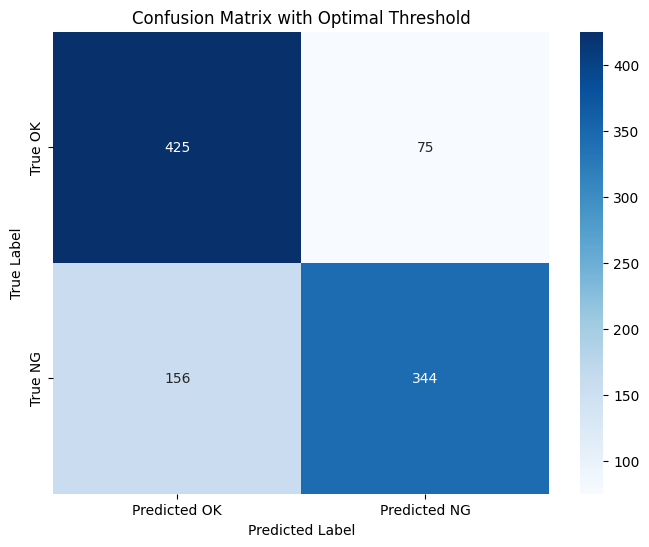


Classification Report (Optimal Threshold):

          Precision Recall    F1-Score  
can_ok    0.73      0.85      0.79      
can_ng    0.82      0.69      0.75      


In [ ]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix, classification_report
import numpy as np

# 1. Áp dụng ngưỡng tối ưu để phân loại từng ảnh kiểm tra
predicted_labels_optimized = []
for error in test_reconstruction_errors:
    if error <= optimal_threshold:
        predicted_labels_optimized.append('can_ok')
    else:
        predicted_labels_optimized.append('can_ng')
predicted_labels_optimized = np.array(predicted_labels_optimized)

print(f"Predicted labels generated with optimal threshold for {len(predicted_labels_optimized)} test images.")

# 2. Chuyển đổi nhãn thực và nhãn dự đoán thành định dạng số (0: can_ok, 1: can_ng)
# true_labels_numeric_roc already exists from the previous step
predicted_labels_numeric_optimized = np.array([1 if label == 'can_ng' else 0 for label in predicted_labels_optimized])

# 3. Tính toán Ma trận nhầm lẫn (Confusion Matrix)
cm_optimized = confusion_matrix(true_labels_numeric_roc, predicted_labels_numeric_optimized)

# 4. Tính toán độ chính xác (Accuracy), Precision, Recall và F1-score
overall_accuracy_optimized = accuracy_score(true_labels_numeric_roc, predicted_labels_numeric_optimized) * 100

# For precision, recall, f1-score, we need to specify labels and target_names if we want class-specific reports
# labels: [0, 1] corresponding to ['can_ok', 'can_ng']
# target_names: ['can_ok', 'can_ng']

report = classification_report(true_labels_numeric_roc, predicted_labels_numeric_optimized, target_names=['can_ok', 'can_ng'], output_dict=True)

precision_can_ok = report['can_ok']['precision']
recall_can_ok = report['can_ok']['recall']
f1_score_can_ok = report['can_ok']['f1-score']

precision_can_ng = report['can_ng']['precision']
recall_can_ng = report['can_ng']['recall']
f1_score_can_ng = report['can_ng']['f1-score']

# Update correct_predictions and incorrect_predictions for consistency with the new threshold
correct_predictions_opt = {'can_ng': 0, 'can_ok': 0}
incorrect_predictions_opt = {'can_ng': 0, 'can_ok': 0}

for i in range(len(true_labels_numeric_roc)):
    true_label = 'can_ng' if true_labels_numeric_roc[i] == 1 else 'can_ok'
    pred_label = predicted_labels_optimized[i]

    if true_label == pred_label:
        correct_predictions_opt[true_label] += 1
    else:
        incorrect_predictions_opt[true_label] += 1

print("\n--- Evaluation Results ---")
print("Correct Predictions:", correct_predictions_opt)
print("Incorrect Predictions:", incorrect_predictions_opt)

total_images_processed = len(true_labels_numeric_roc)
print(f"\nTotal test images processed: {total_images_processed}")
print(f"Overall Accuracy: {overall_accuracy_optimized:.2f}%")

# Calculate accuracy for each label based on optimized predictions
total_can_ng_images = correct_predictions_opt['can_ng'] + incorrect_predictions_opt['can_ng']
accuracy_can_ng_opt = (correct_predictions_opt['can_ng'] / total_can_ng_images) * 100 if total_can_ng_images > 0 else 0

total_can_ok_images = correct_predictions_opt['can_ok'] + incorrect_predictions_opt['can_ok']
accuracy_can_ok_opt = (correct_predictions_opt['can_ok'] / total_can_ok_images) * 100 if total_can_ok_images > 0 else 0

print("\n--- Detailed Accuracy Results ---")
print(f"Accuracy for 'can_ng': {accuracy_can_ng_opt:.2f}%")
print(f"Accuracy for 'can_ok': {accuracy_can_ok_opt:.2f}%")

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(cm_optimized, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Predicted OK', 'Predicted NG'],
            yticklabels=['True OK', 'True NG'])
plt.title('Confusion Matrix with Optimal Threshold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

print("\nClassification Report (Optimal Threshold):\n")
print(f"{'':<10}{'Precision':<10}{'Recall':<10}{'F1-Score':<10}")
print(f"{'can_ok':<10}{precision_can_ok:<10.2f}{recall_can_ok:<10.2f}{f1_score_can_ok:<10.2f}")
print(f"{'can_ng':<10}{precision_can_ng:<10.2f}{recall_can_ng:<10.2f}{f1_score_can_ng:<10.2f}")

###HIỂN THỊ ẢNH KẾT QUẢ

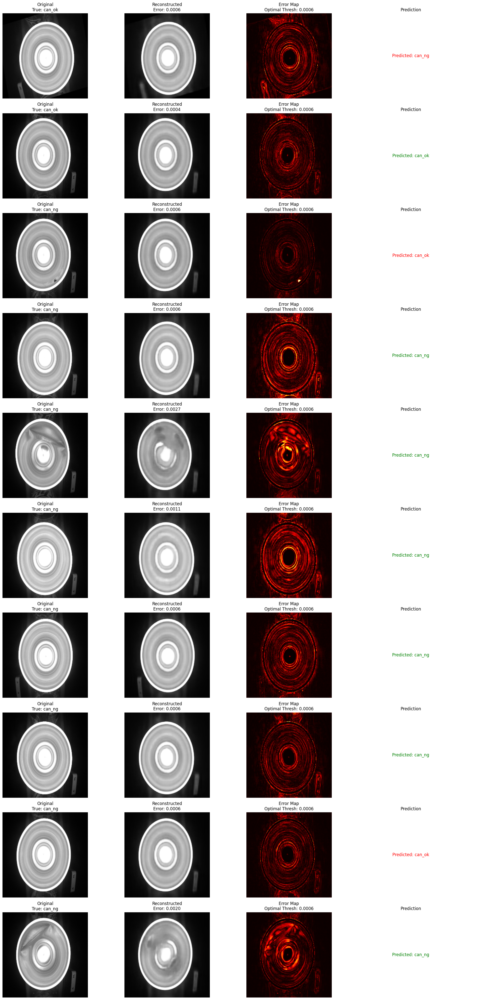

In [ ]:
import matplotlib.pyplot as plt
import random
import numpy as np

# --- 1. Hiển thị kết quả kiểm tra một số ảnh mẫu với ngưỡng tối ưu ---

# Lấy ngẫu nhiên một vài ảnh từ tập kiểm tra
num_samples = 10 # Displaying 10 sample images
indices = random.sample(range(len(dataset_test_images)), num_samples)

plt.figure(figsize=(20, 4 * num_samples)) # Tăng chiều cao để đủ chỗ cho nhiều ảnh

for i, idx in enumerate(indices):
    original_image = dataset_test_images[idx]
    reconstructed_image = reconstructed_test_images[idx]
    error = test_reconstruction_errors[idx]
    true_label = dataset_test_labels[idx]
    predicted_label = predicted_labels_optimized[idx] # Use optimized predictions

    # Hình ảnh gốc
    plt.subplot(num_samples, 4, i * 4 + 1)
    plt.imshow(original_image.squeeze(), cmap='gray')
    plt.title(f"Original\nTrue: {true_label}")
    plt.axis('off')

    # Hình ảnh tái tạo
    plt.subplot(num_samples, 4, i * 4 + 2)
    plt.imshow(reconstructed_image.squeeze(), cmap='gray')
    plt.title(f"Reconstructed\nError: {error:.4f}")
    plt.axis('off')

    # Heatmap lỗi (tùy chọn, để xem vùng lỗi lớn)
    error_map = np.abs(original_image - reconstructed_image).squeeze()
    plt.subplot(num_samples, 4, i * 4 + 3)
    plt.imshow(error_map, cmap='hot') # Using 'hot' colormap for error map
    plt.title(f"Error Map\nOptimal Thresh: {optimal_threshold:.4f}")
    plt.axis('off')

    # Kết quả dự đoán
    plt.subplot(num_samples, 4, i * 4 + 4)
    plt.text(0.5, 0.5, f"Predicted: {predicted_label}",
             horizontalalignment='center', verticalalignment='center',
             fontsize=12, color='green' if true_label == predicted_label else 'red')
    plt.title(f"Prediction")
    plt.axis('off')

plt.tight_layout()
plt.show()

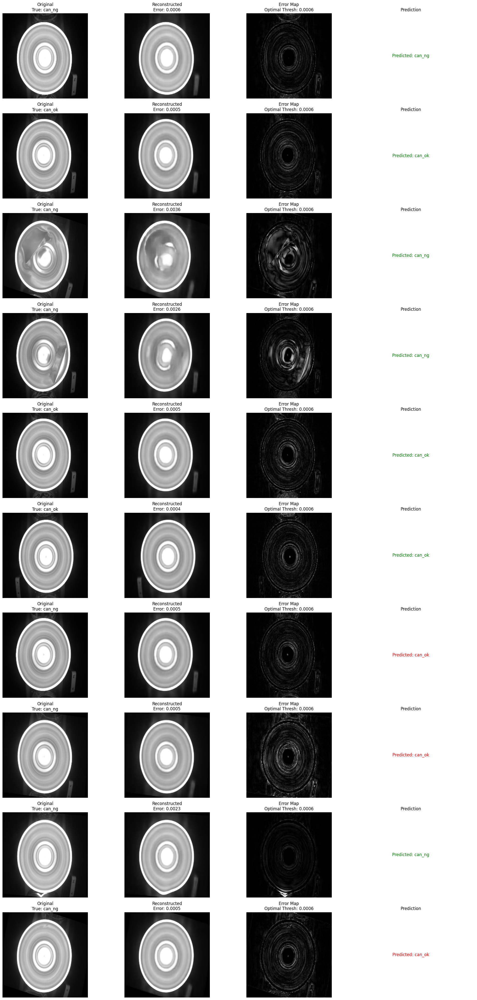

In [ ]:
import matplotlib.pyplot as plt
import random
import numpy as np

# --- 1. Hiển thị kết quả kiểm tra một số ảnh mẫu với ngưỡng tối ưu ---

# Lấy ngẫu nhiên một vài ảnh từ tập kiểm tra
num_samples = 10 # Displaying 10 sample images
indices = random.sample(range(len(dataset_test_images)), num_samples)

plt.figure(figsize=(20, 4 * num_samples)) # Tăng chiều cao để đủ chỗ cho nhiều ảnh

for i, idx in enumerate(indices):
    original_image = dataset_test_images[idx]
    reconstructed_image = reconstructed_test_images[idx]
    error = test_reconstruction_errors[idx]
    true_label = dataset_test_labels[idx]
    predicted_label = predicted_labels_optimized[idx] # Use optimized predictions

    # Hình ảnh gốc
    plt.subplot(num_samples, 4, i * 4 + 1)
    plt.imshow(original_image.squeeze(), cmap='gray')
    plt.title(f"Original\nTrue: {true_label}")
    plt.axis('off')

    # Hình ảnh tái tạo
    plt.subplot(num_samples, 4, i * 4 + 2)
    plt.imshow(reconstructed_image.squeeze(), cmap='gray')
    plt.title(f"Reconstructed\nError: {error:.4f}")
    plt.axis('off')

    # Heatmap lỗi (tùy chọn, để xem vùng lỗi lớn)
    error_map = np.abs(original_image - reconstructed_image).squeeze()
    plt.subplot(num_samples, 4, i * 4 + 3)
    plt.imshow(error_map, cmap='gray') # Using 'hot' colormap for error map
    plt.title(f"Error Map\nOptimal Thresh: {optimal_threshold:.4f}")
    plt.axis('off')

    # Kết quả dự đoán
    plt.subplot(num_samples, 4, i * 4 + 4)
    plt.text(0.5, 0.5, f"Predicted: {predicted_label}",
             horizontalalignment='center', verticalalignment='center',
             fontsize=12, color='green' if true_label == predicted_label else 'red')
    plt.title(f"Prediction")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Lưu và Tải mô hình Autoencoder

In [ ]:
import tensorflow as tf

# 1. Save the trained autoencoder model
model_path = 'autoencoder_model.h5'
autoencoder.save(model_path)
print(f"Autoencoder model saved successfully to {model_path}")

# 2. Load the saved model
loaded_autoencoder_model = tf.keras.models.load_model(model_path)
print(f"Autoencoder model loaded successfully from {model_path}")

# Optional: Verify the loaded model summary or make a prediction
# loaded_autoencoder_model.summary()

Autoencoder model saved successfully to autoencoder_model.h5
Autoencoder model loaded successfully from autoencoder_model.h5


In [ ]:
# Optional: Verify the loaded model summary or make a prediction
loaded_autoencoder_model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_24 (Conv2D)              │ (None, 16, 16, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_9 (UpSampling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 32, 32, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_10 (UpSampling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 64, 64, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_11 (UpSampling2D) │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_27 (Conv2D)              │ (None, 128, 128, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 665,604 (2.54 MB)

 Trainable params: 332,801 (1.27 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 332,803 (1.27 MB)

In [ ]:
import tensorflow as tf

# 1. Save the trained autoencoder model using the recommended Keras native format
model_path = 'autoencoder_model.keras'
autoencoder.save(model_path)
print(f"Autoencoder model saved successfully to {model_path}")

# 2. Load the saved model without compiling to avoid optimizer warnings if only for inference
loaded_autoencoder_model = tf.keras.models.load_model(model_path, compile=False)
print(f"Autoencoder model loaded successfully from {model_path} without optimizer.")

# If you intend to resume training, you would then compile it:
# loaded_autoencoder_model.compile(optimizer='adam', loss='mean_squared_error')

# Optional: Verify the loaded model summary or make a prediction
# loaded_autoencoder_model.summary()

Autoencoder model saved successfully to autoencoder_model.keras
Autoencoder model loaded successfully from autoencoder_model.keras without optimizer.


# Tải ảnh lên kiểm thử


Using target image size: (224, 224)
Using anomaly detection threshold: 0.0008
Please upload an image for prediction:


Saving can_ng (7).bmp to can_ng (7).bmp
Processing uploaded image: can_ng (7).bmp
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

--- Prediction Results for can_ng (7).bmp ---
Reconstruction Error: 0.0009
Predicted Class: can_ng
Threshold: 0.0008


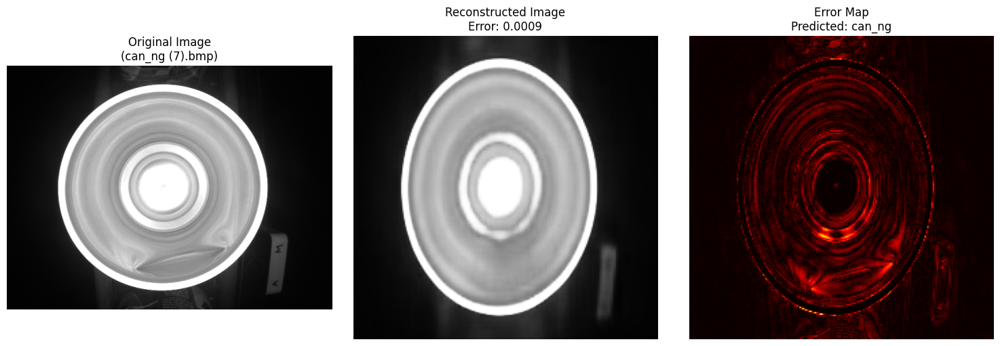

In [ ]:
from google.colab import files
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ensure target_size and threshold are defined. They should be from previous steps.
# Example (uncomment and adjust if they are not available in current scope):
# target_size = (224, 224) # Or whatever size your model was trained on
# threshold = 0.0060       # Or whatever threshold was calculated

print(f"Using target image size: {target_size}")
print(f"Using anomaly detection threshold: {threshold:.4f}")

# 1. Upload a new image
print("Please upload an image for prediction:")
uploaded = files.upload()

for fn in uploaded.keys():
    # 2. Read and preprocess the uploaded image
    image_bytes = np.frombuffer(uploaded[fn], np.uint8)
    uploaded_image = cv2.imdecode(image_bytes, cv2.IMREAD_GRAYSCALE)

    if uploaded_image is None:
        print(f"Error: Could not read uploaded image {fn}. Please ensure it's a valid image file.")
        continue

    # Resize and normalize
    resized_image = cv2.resize(uploaded_image, target_size)
    normalized_image = resized_image.astype('float32') / 255.0

    # Reshape for model input (batch_size, height, width, channels)
    model_input_image = normalized_image.reshape(1, target_size[0], target_size[1], 1)

    print(f"Processing uploaded image: {fn}")

    # 3. Use the loaded Autoencoder model to reconstruct the image
    reconstructed_uploaded_image = loaded_autoencoder_model.predict(model_input_image)

    # 4. Calculate the reconstruction error
    error = np.mean(np.square(model_input_image - reconstructed_uploaded_image))

    # 5. Classify based on the threshold
    predicted_class = 'can_ok' if error <= threshold else 'can_ng'

    print(f"\n--- Prediction Results for {fn} ---")
    print(f"Reconstruction Error: {error:.4f}")
    print(f"Predicted Class: {predicted_class}")
    print(f"Threshold: {threshold:.4f}")

    # 6. Visualize the original, reconstructed, and error map
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(uploaded_image, cmap='gray')
    plt.title(f"Original Image\n({fn})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_uploaded_image.squeeze(), cmap='gray')
    plt.title(f"Reconstructed Image\nError: {error:.4f}")
    plt.axis('off')

    error_map = np.abs(model_input_image - reconstructed_uploaded_image).squeeze()
    plt.subplot(1, 3, 3)
    plt.imshow(error_map, cmap='hot')
    plt.title(f"Error Map\nPredicted: {predicted_class}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

Using target image size: (224, 224)
Using anomaly detection threshold: 0.0008
Selected image for prediction: /content/dataset/DATA_TEST/can_ok (181).bmp
Processing image: can_ok (181).bmp
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step

--- Prediction Results for can_ok (181).bmp ---
Reconstruction Error: 0.0005
Predicted Class: can_ok
Threshold: 0.0008


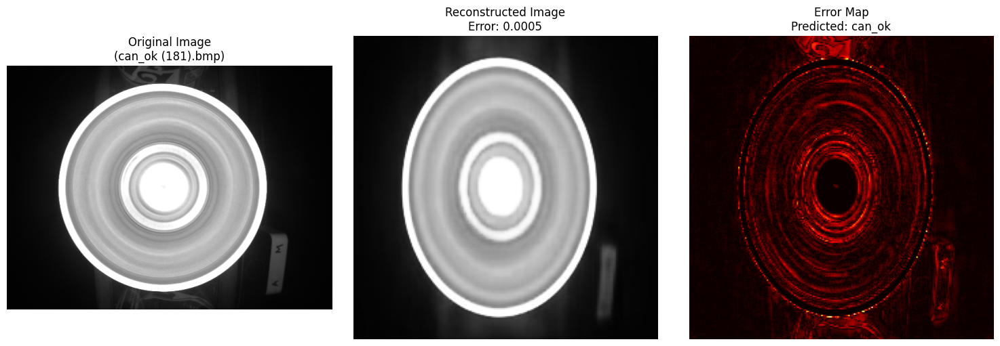

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Ensure target_size and threshold are defined. They should be from previous steps.
# target_size = (128, 128) # Already defined
# threshold = 0.0015       # Already defined

print(f"Using target image size: {target_size}")
print(f"Using anomaly detection threshold: {threshold:.4f}")

# 1. Dynamically select a random image path from the test directory
test_image_dir = '/content/dataset/DATA_TEST' # Corrected to the directory path
all_test_files = [f for f in os.listdir(test_image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]

if not all_test_files:
    print(f"Error: No image files found in {test_image_dir}. Please check the directory.")
elif len(all_test_files) != len(dataset_test_labels):
    print("Warning: Number of files in directory does not match preprocessed test images. Selecting from preprocessed indices.")
    # If the direct list of files doesn't match, use the indices from dataset_test_labels
    random_idx = random.choice(range(len(dataset_test_labels)))
    image_filename = os.listdir(test_image_dir)[random_idx] # This is a risky way to get the exact filename
    # A better approach is to store filenames during preprocessing of dataset_test_images
    # For now, we'll pick a random one from `all_test_files`
    image_filename = random.choice(all_test_files)
else:
    image_filename = random.choice(all_test_files)

image_path = os.path.join(test_image_dir, image_filename)
print(f"Selected image for prediction: {image_path}")

# Optional: Print all files in the directory for user reference
# print(f"\nAvailable files in {test_image_dir}:\n{os.listdir(test_image_dir)}")

# 2. Read and preprocess the specified image
uploaded_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if uploaded_image is None:
    print(f"Error: Could not read image from {image_path}. This file might be corrupted or in an unsupported format. Please try another file.")
else:
    # Resize and normalize
    resized_image = cv2.resize(uploaded_image, target_size)
    normalized_image = resized_image.astype('float32') / 255.0

    # Reshape for model input (batch_size, height, width, channels)
    model_input_image = normalized_image.reshape(1, target_size[0], target_size[1], 1)

    print(f"Processing image: {image_filename}")

    # 3. Use the loaded Autoencoder model to reconstruct the image
    reconstructed_uploaded_image = loaded_autoencoder_model.predict(model_input_image)

    # 4. Calculate the reconstruction error
    error = np.mean(np.square(model_input_image - reconstructed_uploaded_image))

    # 5. Classify based on the threshold
    predicted_class = 'can_ok' if error <= threshold else 'can_ng'

    print(f"\n--- Prediction Results for {image_filename} ---")
    print(f"Reconstruction Error: {error:.4f}")
    print(f"Predicted Class: {predicted_class}")
    print(f"Threshold: {threshold:.4f}")

    # 6. Visualize the original, reconstructed, and error map
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(uploaded_image, cmap='gray')
    plt.title(f"Original Image\n({image_filename})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_uploaded_image.squeeze(), cmap='gray')
    plt.title(f"Reconstructed Image\nError: {error:.4f}")
    plt.axis('off')

    error_map = np.abs(model_input_image - reconstructed_uploaded_image).squeeze()
    plt.subplot(1, 3, 3)
    plt.imshow(error_map, cmap='hot')
    plt.title(f"Error Map\nPredicted: {predicted_class}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

Using target image size: (224, 224)
Using anomaly detection threshold: 0.0008
Selected image for prediction: /content/dataset/DATA_TEST/can_ng (1122).bmp
Processing image: can_ng (1122).bmp
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step

--- Prediction Results for can_ng (1122).bmp ---
Reconstruction Error: 0.0026
Predicted Class: can_ng
Threshold: 0.0008


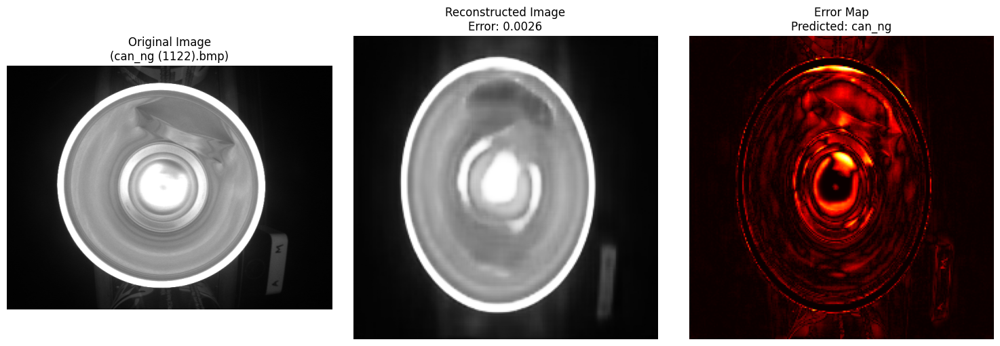

In [ ]:
#CODE LẤY NGẪU NHIÊN 1 ẢNH TRONG DATA_TEST

import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Ensure target_size and threshold are defined. They should be from previous steps.
# target_size = (128, 128) # Already defined
# threshold = 0.0015       # Already defined

print(f"Using target image size: {target_size}")
print(f"Using anomaly detection threshold: {threshold:.4f}")

# 1. Specify the image path directly
image_path = '/content/dataset/DATA_TEST/can_ng (1122).bmp' # Thay đổi đường dẫn này đến file ảnh bạn muốn

# Check if the specified image file exists
if not os.path.exists(image_path):
    print(f"Error: Image file not found at {image_path}. Please check the path.")
    # Optionally, you could exit or skip processing here if the file doesn't exist
    # For now, let's proceed to the 'uploaded_image is None' check

image_filename = os.path.basename(image_path)
print(f"Selected image for prediction: {image_path}")

# Optional: Print all files in the directory for user reference
# print(f"\nAvailable files in {test_image_dir}:\n{os.listdir(test_image_dir)}")

# 2. Read and preprocess the specified image
uploaded_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

if uploaded_image is None:
    print(f"Error: Could not read image from {image_path}. This file might be corrupted or in an unsupported format. Please try another file.")
else:
    # Resize and normalize
    resized_image = cv2.resize(uploaded_image, target_size)
    normalized_image = resized_image.astype('float32') / 255.0

    # Reshape for model input (batch_size, height, width, channels)
    model_input_image = normalized_image.reshape(1, target_size[0], target_size[1], 1)

    print(f"Processing image: {image_filename}")

    # 3. Use the loaded Autoencoder model to reconstruct the image
    reconstructed_uploaded_image = loaded_autoencoder_model.predict(model_input_image)

    # 4. Calculate the reconstruction error
    error = np.mean(np.square(model_input_image - reconstructed_uploaded_image))

    # 5. Classify based on the threshold
    predicted_class = 'can_ok' if error <= threshold else 'can_ng'

    print(f"\n--- Prediction Results for {image_filename} ---")
    print(f"Reconstruction Error: {error:.4f}")
    print(f"Predicted Class: {predicted_class}")
    print(f"Threshold: {threshold:.4f}")

    # 6. Visualize the original, reconstructed, and error map
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(uploaded_image, cmap='gray')
    plt.title(f"Original Image\n({image_filename})")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_uploaded_image.squeeze(), cmap='gray')
    plt.title(f"Reconstructed Image\nError: {error:.4f}")
    plt.axis('off')

    error_map = np.abs(model_input_image - reconstructed_uploaded_image).squeeze()
    plt.subplot(1, 3, 3)
    plt.imshow(error_map, cmap='hot')
    plt.title(f"Error Map\nPredicted: {predicted_class}")
    plt.axis('off')

    plt.tight_layout()
    plt.show()